(mmm_multidimensional_example)=
# MMM Multidimensional Example Notebook

In this notebook, we present an new experimental media mix model class to create multidimensional and customized marketing mix models. To showcase its capabilities, we extend the {ref}`mmm_example` simulation to create a multidimensional hierarchical model.

```{warning}
Even though the new {class}`MMM <pymc_marketing.mmm.multidimensional.MMM>` class is an experimental class, it is fully functional and can be used to create multidimensional marketing mix models. This model is under active development and will be further improved in the future (feedback welcome!).
```

## Prepare Notebook


In [1]:
import warnings

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import pymc as pm
import seaborn as sns
import xarray as xr
from pymc_extras.prior import Prior

from pymc_marketing.mmm import GeometricAdstock, LogisticSaturation
from pymc_marketing.mmm.multidimensional import (
    MMM,
    MultiDimensionalBudgetOptimizerWrapper,
)
from pymc_marketing.paths import data_dir
from pymc_marketing.special_priors import LaplacePrior, LogNormalPrior

warnings.filterwarnings("ignore", category=UserWarning)

az.style.use("arviz-darkgrid")
plt.rcParams["figure.figsize"] = [12, 7]
plt.rcParams["figure.dpi"] = 100
plt.rcParams["xtick.labelsize"] = 10
plt.rcParams["ytick.labelsize"] = 8

%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

In [2]:
seed: int = sum(map(ord, "mmm_multidimensional"))
rng: np.random.Generator = np.random.default_rng(seed=seed)

## Read Data

We read the simulated data from the {ref}`mmm_multidimensional_example`.

In [3]:
data_path = data_dir / "mmm_multidimensional_example.csv"

data_df = pd.read_csv(data_path, parse_dates=["date"])
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 318 entries, 0 to 317
Data columns (total 7 columns):
 #   Column   Non-Null Count  Dtype         
---  ------   --------------  -----         
 0   date     318 non-null    datetime64[ns]
 1   geo      318 non-null    object        
 2   x1       318 non-null    float64       
 3   x2       318 non-null    float64       
 4   event_1  318 non-null    int64         
 5   event_2  318 non-null    int64         
 6   y        318 non-null    float64       
dtypes: datetime64[ns](1), float64(3), int64(2), object(1)
memory usage: 17.5+ KB


For our setup, imagine we are selling one product in two different countries (`geo_a` and `geo_b`). Our marketing team maintains two channels - one is a usually-on channel while the other channel is more tactical and is turned on during marketing campaigns. Visual inspection of the data suggests that there is at least some effect of marketing on sales, but the relationship is noisy. Our mission is to see if the MMM can parse the signal in the noise.

One strategy for dealing with noisy, low-signal data is to borrow information from similar contexts. If channel 2 seems to be pretty effective in `geo_b`, that gives us reason to suspect it will be effective in `geo_a`. This can be implemented either with **full pooling** or **partial pooling** (partial pooling models are often called 'hierarchical' or 'multi-level'). So this notebook will demonstrate how to fit an MMM to multiple markets at the same time and make decisions about how to pool information across the two contexts.

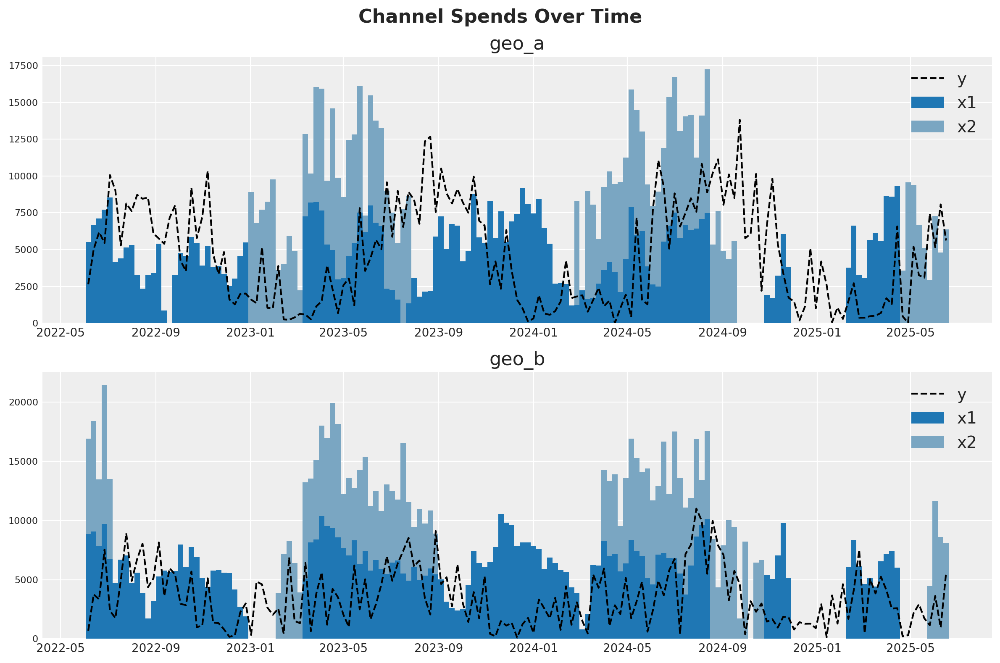

In [4]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(12, 8))
fig.suptitle("Channel Spends Over Time", fontsize=16, fontweight="bold")

blue_colors = ["#1f77b4", "#7aa6c2"]  # Darker and lighter shades of blue

# Plot for geo_a
geo_a_data = data_df[data_df["geo"] == "geo_a"]
ax1.bar(geo_a_data["date"], geo_a_data["x1"], label="x1", width=7, color=blue_colors[0])
ax1.bar(
    geo_a_data["date"],
    geo_a_data["x2"],
    bottom=geo_a_data["x1"],
    label="x2",
    width=7,
    color=blue_colors[1],
)
ax1.plot(geo_a_data["date"], geo_a_data["y"], "--", label="y", color="black")
ax1.set_title("geo_a")
ax1.legend()

# Plot for geo_b
geo_b_data = data_df[data_df["geo"] == "geo_b"]
ax2.bar(geo_b_data["date"], geo_b_data["x1"], label="x1", width=7, color=blue_colors[0])
ax2.bar(
    geo_b_data["date"],
    geo_b_data["x2"],
    bottom=geo_b_data["x1"],
    label="x2",
    width=7,
    color=blue_colors[1],
)
ax2.plot(geo_b_data["date"], geo_b_data["y"], "--", label="y", color="black")
ax2.set_title("geo_b")
ax2.legend()

plt.tight_layout()

## Prior Specification

A product may perform very differently in distinct markets, popular in some locations but rather niche in others. If this is the case, observing how a product is doing in one market doesn't tell us much about how it will be doing in another.

Alternatively, a product may behave very consistently across markets, either always loved or ignored. If so, we can better predict response across markets, including for those that we may only have noisy measurements.

More realistically, hierarchical models allow for a continuous interpolation between these two scenarios, adaptively pooling information to the extent it seems warranted. This is also called **partial pooling**. If you need an introduction on Bayesian hierarchical models, check out the comprehensive example ["A Primer on Bayesian Methods for Multilevel Modeling"](https://www.pymc.io/projects/examples/en/latest/generalized_linear_models/multilevel_modeling.html) in the PyMC documentation.

This notebook we'll illustrate hierarchical modeling in MMM models. This can be controlled via the `dims` argument of `Prior` objects used in `model_config`. We'll show you how to code each type of assumption you might make (we aren't recommending it as a good model!).

Let's start with the beta parameter of the saturation curve, which represents the maximum number of weekly sales you could drive through a channel. It will be the only parameter we model hierarchically.

 The `beta_prior` below has dimensions of `channel` and `geo`, meaning we will have one beta parameter per channel and per geographic market. The parameters, `mu` and `std`, also have a prior. But critically, they only have `channel` dimensions.

This forces the prior parameters to be shared across distinct geographies and, therefore, be compatible with all of them.

Specifically, the prior on `mean` captures what we expect each channel to do on average, without considering their variation on geography, while the prior on `std` represents how much the effect varies across geographies. `std` encodes the strength of "pooling". If it's large, channels are expected to vary widely, if it's small they are expected to be similarly behaved.

*Note that distinct channels are still independent. If we wanted, we could have pooled information across channels by using a single mean and std prior shared between all channels and geographies.*

In [5]:
beta_prior = LogNormalPrior(
    mean=Prior("Gamma", mu=0.25, sigma=0.10, dims="channel"),
    std=Prior("Exponential", scale=0.10, dims="channel"),
    dims=("channel", "geo"),
    centered=False,
)

Next we look at lambda, which represents the efficiency of a channel. The higher the lambda, the faster sales respond to spending on that channel. We'll have the lambda parameter be **fully pooled** across all geographies. We are assuming that channel 1 has the same efficiency in both geographical markets, so we do not specify "geo" dims.

Note that by using constants for the parameters, there's no shared learnable priors (i.e., hierarchical structure). This is what enforces a complete pooling structure.

In [6]:
lam_prior = Prior("Gamma", mu=0.5, sigma=0.25, dims="channel")

saturation = LogisticSaturation(
    priors={
        "beta": beta_prior,
        "lam": lam_prior,
    },
)
saturation.model_config

{'saturation_lam': Prior("Gamma", mu=0.5, sigma=0.25, dims="channel"),
 'saturation_beta': <pymc_marketing.special_priors.LogNormalPrior at 0x301c99e80>}

The alpha parameter of the Adstock function represents how long customers remember marketing. We'll choose an **unpooled** structure. Here, each channel in each geography has its own effect and those effects do not influence each other. Notice that we put a dim for both geos and channels to indicate that we want 4 unique effects.

Once again we have no learnable parameters inside the prior of `alpha`. We could have tried to specify priors with the same dimensions `geo` and `channel`, which would still imply no-pooling of information. But if we did that, the model would become too undetermined, with each parameter prior only informed by one single alpha parameter each.

In [7]:
alpha_prior = Prior("Beta", alpha=2, beta=5, dims=("geo", "channel"))

adstock = GeometricAdstock(
    priors={"alpha": alpha_prior},
    l_max=8,
)

adstock.model_config

{'adstock_alpha': Prior("Beta", alpha=2, beta=5, dims=("geo", "channel"))}

You can mix and match the unpooled, fully pooled, and partially pooled strategy for any of your effects. You can extend this strategy to controls or noise parameters as well. Given the variety of options, it can be hard to know which pooling strategy to choose for a given effect. In our opinion, the choice is primarily driven by computational considerations. Partial pooling is generally a more reasonable assumption, but it can make the model slower or harder to estimate, and more difficult to reason about.

For example, you might notice that we set our `beta` prior with `centered=False`. This is known as a *reparameterization*, a[ strategy to solve computational difficulties](https://www.pymc.io/projects/examples/en/latest/diagnostics_and_criticism/Diagnosing_biased_Inference_with_Divergences.html) that MCMC algorithms can run into when fitting hierarchical models, specially with small dimensions (remember we have just two channels and two geographies!).

We recommend that you start with a model that uses only fully pooled or unpooled effects. Once you have a good working model you can add complexity slowly, verifying your model performance and accuracy at each stage.

We complete the model specification with similar priors as in the {ref}`mmm_example`.

In [8]:
model_config = {
    "intercept": Prior("Gamma", mu=0.5, sigma=0.25, dims="geo"),
    "gamma_control": Prior("Normal", mu=0, sigma=0.5, dims="control"),
    "gamma_fourier": LaplacePrior(
        mu=0,
        b=Prior("HalfNormal", sigma=0.2),
        dims=("geo", "fourier_mode"),
        centered=False,
    ),
    "likelihood": Prior(
        "TruncatedNormal",
        lower=0,
        sigma=Prior("HalfNormal", sigma=1.5),
        dims=("date", "geo"),
    ),
}

## Model Definition

We are now ready to define the model class. The API is very similar to the one in the {ref}`mmm_example`. 

In [9]:
# Base MMM model specification
mmm = MMM(
    date_column="date",
    target_column="y",
    channel_columns=["x1", "x2"],
    control_columns=["event_1", "event_2"],
    dims=("geo",),
    scaling={
        "channel": {"method": "max", "dims": ()},
        "target": {"method": "max", "dims": ()},
    },
    adstock=adstock,
    saturation=saturation,
    yearly_seasonality=2,
    model_config=model_config,
)

```{tip}
Observe we have the following two new arguments:
- `dims`: a tuple of strings that specify the dimensions of the model.
- `scaling`: a dictionary that specifies the scaling method and dimensions for the target  and media variables. In this case we leave the dimensions empty as we want to scale the target variable for each geo (see details below).
```




We can now prepare the training data.

In [10]:
x_train = data_df.drop(columns=["y"])
y_train = data_df["y"]

To build the model, we need to specify the training data and the target variables.

```{tip}
We do not need to build the model, we can simply fit the model. This is just to inspect the model structure.
```

In [11]:
mmm.build_model(X=x_train, y=y_train)

Let's look into the model graph:

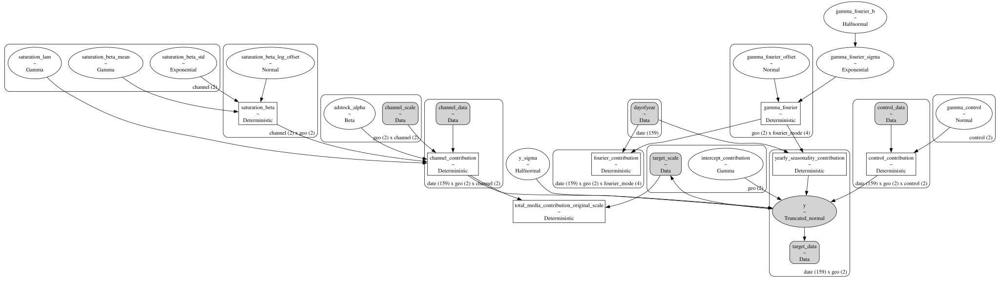

In [12]:
mmm.model.to_graphviz()

It may be easier to visualize the dimensions of each parameter in a table format:

In [13]:
mmm.table()

                             Variable  Expression                             Dimensions                           
───────────────────────────────────────────────────────────────────────────────────────────────────────────────────
                      channel_scale =  Data                                   geo[2] × channel[2]                  
                       target_scale =  Data                                   geo[2]                               
                       channel_data =  Data                                   date[159] × geo[2] × channel[2]      
                        target_data =  Data                                   date[159] × geo[2]                   
                       control_data =  Data                                   date[159] × geo[2] × control[2]      
                          dayofyear =  Data                                   date[159]                            
                                                                                                                   
             intercept_contribution ~  Gamma(f(), f())                        geo[2]                               
                      adstock_alpha ~  Beta(2, 5)                             geo[2] × channel[2]                  
                     saturation_lam ~  Gamma(f(), f())                        channel[2]                           
               saturation_beta_mean ~  Gamma(f(), f())                        channel[2]                           
                saturation_beta_std ~  Exponential(0.1)                       channel[2]                           
         saturation_beta_log_offset ~  Normal(0, 1)                           channel[2] × geo[2]                  
                      gamma_control ~  Normal(0, 0.5)                         control[2]                           
                    gamma_fourier_b ~  HalfNormal(0, 0.2)                                                          
                gamma_fourier_sigma ~  Exponential(f(gamma_fourier_b))                                             
               gamma_fourier_offset ~  Normal(0, 1)                           geo[2] × fourier_mode[4]             
                            y_sigma ~  HalfNormal(0, 1.5)                                                          
                                                                              Parameter count = 29                 
                                                                                                                   
                    saturation_beta =  f(saturation_beta_log_offset,          channel[2] × geo[2]                  
                                       saturation_beta_mean,                                                       
                                       saturation_beta_std)                                                        
               channel_contribution =  f(saturation_lam,                      date[159] × geo[2] × channel[2]      
                                       saturation_beta_log_offset,                                                 
                                       saturation_beta_mean, adstock_alpha,                                        
                                       saturation_beta_std)                                                        
 total_media_contribution_original_s…  f(saturation_lam,                                                           
                                    =  saturation_beta_log_offset,                                                 
                                       saturation_beta_mean, adstock_alpha,                                        
                                       saturation_beta_std)                                                        
               control_contribution =  f(gamma_control)                       date[159] × geo[2] × control[2]      
                      gamma_fourier =  f(gamma_fourier_o

It is great to see that the model automatically vectorizes and creates the expected hierarchies and dimensions 🚀!

As we are scaling our data internally, we can add deterministic terms to recover the component contributions in the original scale.

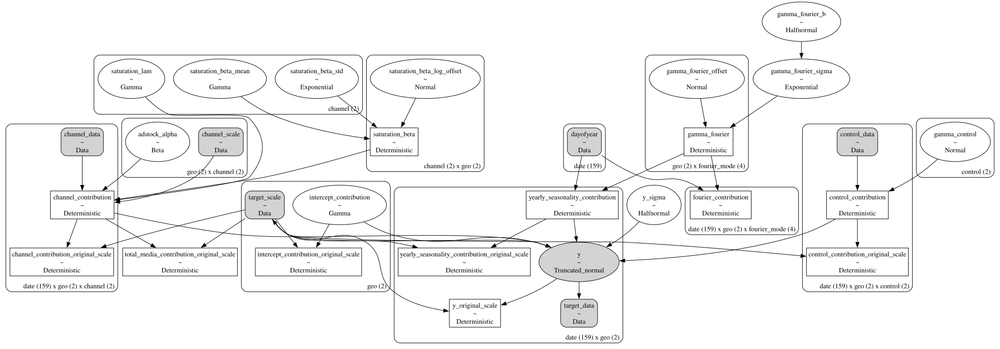

In [14]:
mmm.add_original_scale_contribution_variable(
    var=[
        "channel_contribution",
        "control_contribution",
        "intercept_contribution",
        "yearly_seasonality_contribution",
        "y",
    ]
)

pm.model_to_graphviz(mmm.model)

Coming back to the scalers, we can get them as an xarray dataset.

In [15]:
scalers = mmm.get_scales_as_xarray()

scalers

{'channel_scale': <xarray.DataArray '_channel' (geo: 2, channel: 2)> Size: 32B
 array([[ 9318.97848455,  9755.9729876 ],
        [10555.0774866 , 11760.98180037]])
 Coordinates:
   * geo      (geo) object 16B 'geo_a' 'geo_b'
   * channel  (channel) object 16B 'x1' 'x2',
 'target_scale': <xarray.DataArray '_target' (geo: 2)> Size: 16B
 array([13812.08025674, 11002.97913936])
 Coordinates:
   * geo      (geo) object 16B 'geo_a' 'geo_b'}

As expected, from the model definition, we have scalers for the target and media variables across geos.

## Prior Predictive Checks

Before fitting the model, we can inspect the prior predictive distribution.

In [16]:
with mmm.model:
    prior = pm.sample_prior_predictive()
prior

Sampling: [adstock_alpha, gamma_control, gamma_fourier_b, gamma_fourier_offset, gamma_fourier_sigma, intercept_contribution, saturation_beta_log_offset, saturation_beta_mean, saturation_beta_std, saturation_lam, y, y_sigma]


Inference data with groups:
	> prior
	> prior_predictive
	> observed_data
	> constant_data

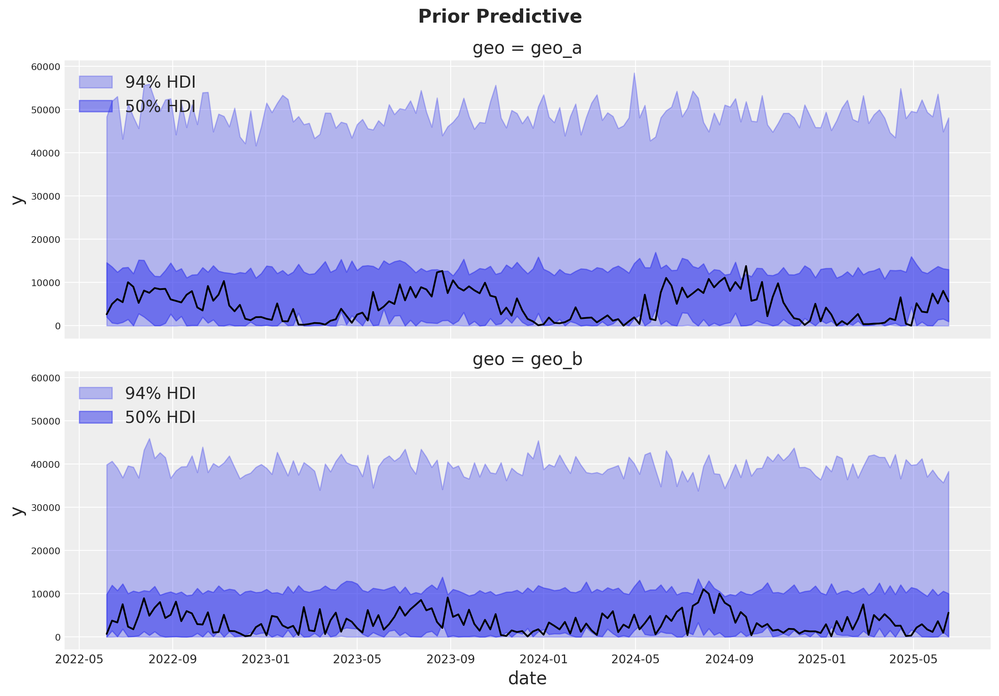

In [17]:
g = sns.relplot(
    data=data_df,
    x="date",
    y="y",
    color="black",
    col="geo",
    col_wrap=1,
    kind="line",
    height=4,
    aspect=3,
)

axes = g.axes.flatten()

for ax, geo in zip(axes, mmm.model.coords["geo"], strict=True):
    az.plot_hdi(
        x=mmm.model.coords["date"],
        y=(
            prior.prior.sel(geo=geo)["y_original_scale"]
            .unstack()
            .transpose(..., "date")
        ),
        smooth=False,
        color="C0",
        hdi_prob=0.94,
        fill_kwargs={"alpha": 0.3, "label": "94% HDI"},
        ax=ax,
    )
    az.plot_hdi(
        x=mmm.model.coords["date"],
        y=(
            prior.prior.sel(geo=geo)["y_original_scale"]
            .unstack()
            .transpose(..., "date")
        ),
        smooth=False,
        color="C0",
        hdi_prob=0.5,
        fill_kwargs={"alpha": 0.5, "label": "50% HDI"},
        ax=ax,
    )
    ax.legend(loc="upper left")

g.figure.suptitle("Prior Predictive", fontsize=16, fontweight="bold", y=1.03);

The prior predictive distribution looks good and not too restrictive.

## Model Fitting

We can now fit the model and generate the posterior predictive distribution.

In [18]:
mmm.fit(
    X=x_train,
    y=y_train,
    chains=4,
    target_accept=0.95,
    random_seed=rng,
)

mmm.sample_posterior_predictive(
    X=x_train,
    random_seed=rng,
)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (4 chains in 4 jobs)
NUTS: [intercept_contribution, adstock_alpha, saturation_lam, saturation_beta_mean, saturation_beta_std, saturation_beta_log_offset, gamma_control, gamma_fourier_b, gamma_fourier_sigma, gamma_fourier_offset, y_sigma]


Output()

Sampling 4 chains for 1_000 tune and 1_000 draw iterations (4_000 + 4_000 draws total) took 11 seconds.


Output()

Sampling: [y]


Output()

<xarray.Dataset> Size: 20MB
Dimensions:           (date: 159, geo: 2, sample: 4000)
Coordinates:
  * date              (date) datetime64[ns] 1kB 2022-06-06 ... 2025-06-16
  * geo               (geo) <U5 40B 'geo_a' 'geo_b'
  * sample            (sample) object 32kB MultiIndex
  * chain             (sample) int64 32kB 0 0 0 0 0 0 0 0 0 ... 3 3 3 3 3 3 3 3
  * draw              (sample) int64 32kB 0 1 2 3 4 5 ... 995 996 997 998 999
Data variables:
    y                 (date, geo, sample) float64 10MB 0.5281 0.6166 ... 0.04538
    y_original_scale  (date, geo, sample) float64 10MB 7.295e+03 ... 499.3
Attributes:
    created_at:                 2026-01-26T15:51:22.357324+00:00
    arviz_version:              0.23.0
    inference_library:          pymc
    inference_library_version:  5.27.0

The sampling looks good. No divergences and the r-hat values are close to $1$.

In [19]:
mmm.idata.sample_stats.diverging.sum("draw")

<xarray.DataArray 'diverging' (chain: 4)> Size: 32B
array([0, 0, 0, 0])
Coordinates:
  * chain    (chain) int64 32B 0 1 2 3

In [20]:
az.summary(
    mmm.idata,
    var_names=[
        "adstock_alpha",
        "gamma_control",
        "gamma_fourier",
        "intercept_contribution",
        "saturation_beta",
        "saturation_beta_mean",
        "saturation_beta_std",
        "saturation_lam",
        "y_sigma",
    ],
)

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
"adstock_alpha[geo_a, x1]",0.294,0.160,0.028,0.587,0.002,0.002,5818.0,2660.0,1.0
"adstock_alpha[geo_a, x2]",0.306,0.165,0.038,0.614,0.002,0.003,6170.0,2233.0,1.0
"adstock_alpha[geo_b, x1]",0.262,0.155,0.021,0.554,0.002,0.003,5405.0,2760.0,1.0
"adstock_alpha[geo_b, x2]",0.278,0.157,0.023,0.555,0.002,0.003,6615.0,2591.0,1.0
gamma_control[event_1],0.304,0.086,0.152,0.479,0.001,0.001,4907.0,2767.0,1.0
gamma_control[event_2],-0.096,0.092,-0.267,0.075,0.001,0.002,5247.0,3088.0,1.0
"gamma_fourier[geo_a, sin_1]",-0.350,0.035,-0.419,-0.290,0.001,0.000,3874.0,3353.0,1.0
"gamma_fourier[geo_a, sin_2]",-0.029,0.028,-0.080,0.023,0.000,0.000,5379.0,3577.0,1.0
"gamma_fourier[geo_a, cos_1]",-0.285,0.033,-0.350,-0.228,0.001,0.000,3965.0,4005.0,1.0
"gamma_fourier[geo_a, cos_2]",0.004,0.028,-0.049,0.055,0.000,0.000,5619.0,3294.0,1.0


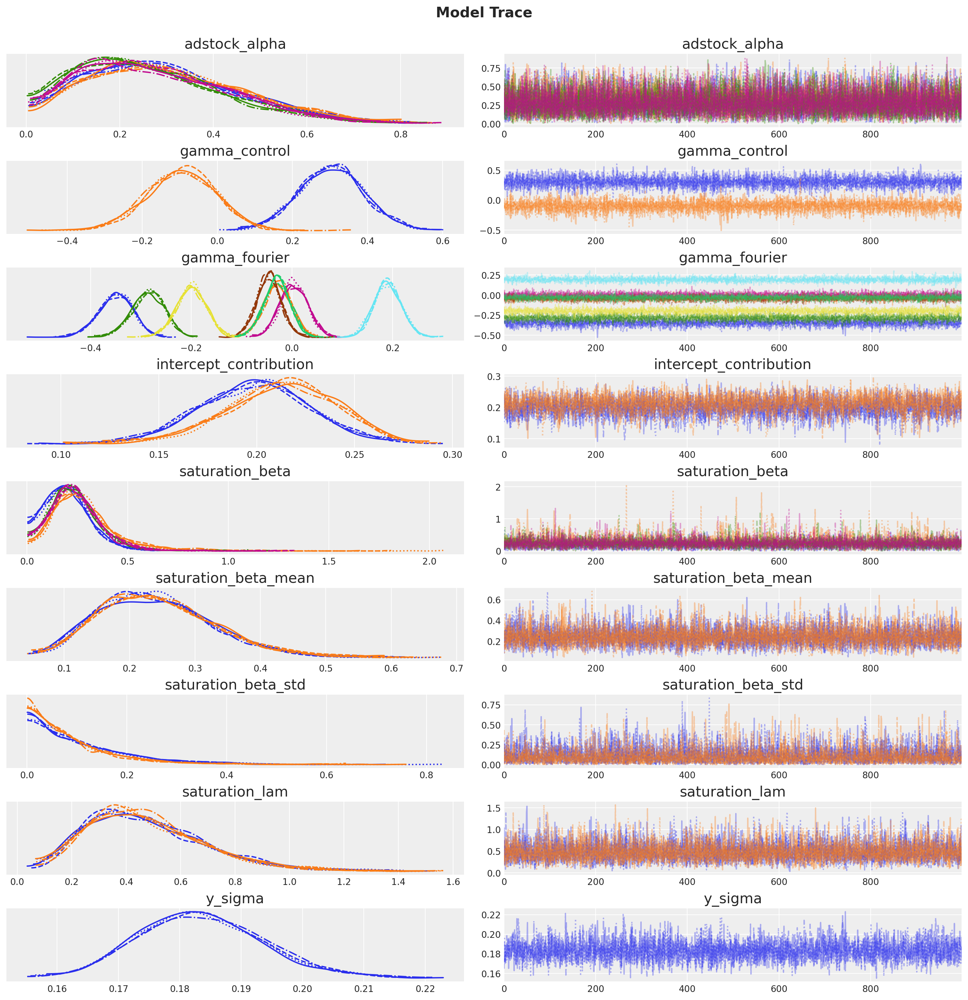

In [21]:
_ = az.plot_trace(
    data=mmm.idata,
    var_names=[
        "adstock_alpha",
        "gamma_control",
        "gamma_fourier",
        "intercept_contribution",
        "saturation_beta",
        "saturation_beta_mean",
        "saturation_beta_std",
        "saturation_lam",
        "y_sigma",
    ],
    compact=True,
    backend_kwargs={"figsize": (15, 15), "layout": "constrained"},
)
plt.gcf().suptitle("Model Trace", fontsize=16, fontweight="bold", y=1.03);

## Posterior Predictive Checks

We can now inspect the posterior predictive distribution. As before, we need to scale the posterior predictive to the original scale to make it comparable to the data.


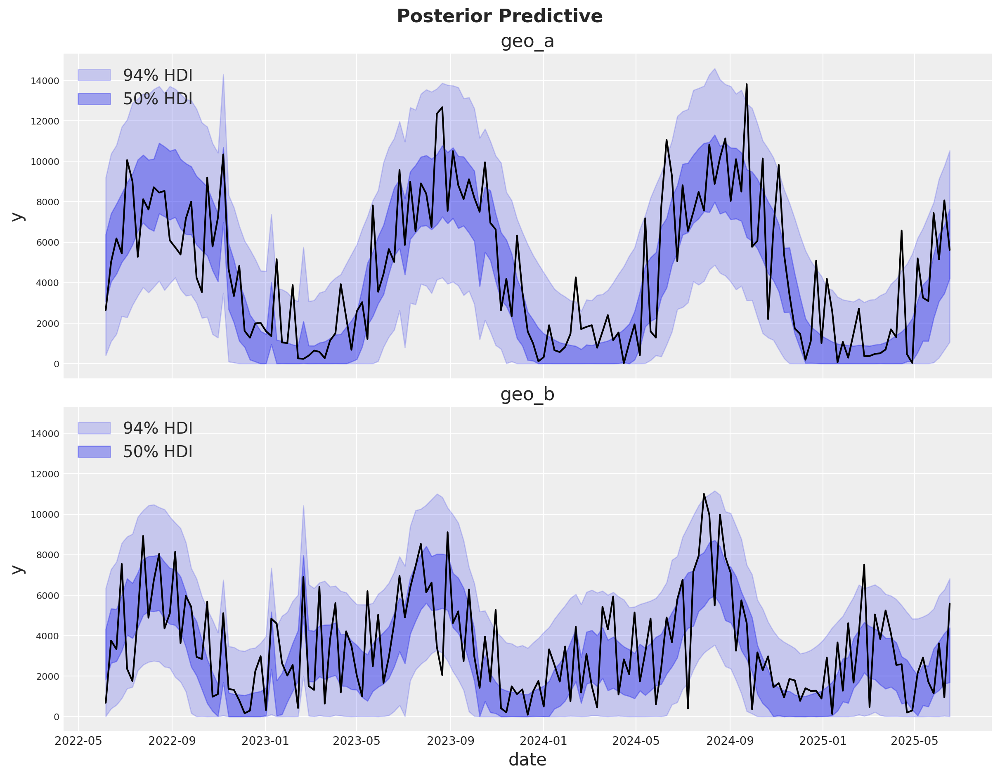

In [22]:
fig, axes = plt.subplots(
    nrows=len(mmm.model.coords["geo"]),
    figsize=(12, 9),
    sharex=True,
    sharey=True,
    layout="constrained",
)

for i, geo in enumerate(mmm.model.coords["geo"]):
    ax = axes[i]
    az.plot_hdi(
        x=mmm.model.coords["date"],
        y=(mmm.idata["posterior_predictive"].y_original_scale.sel(geo=geo)),
        color="C0",
        smooth=False,
        hdi_prob=0.94,
        fill_kwargs={"alpha": 0.2, "label": "94% HDI"},
        ax=ax,
    )

    az.plot_hdi(
        x=mmm.model.coords["date"],
        y=(mmm.idata["posterior_predictive"].y_original_scale.sel(geo=geo)),
        color="C0",
        smooth=False,
        hdi_prob=0.5,
        fill_kwargs={"alpha": 0.4, "label": "50% HDI"},
        ax=ax,
    )

    sns.lineplot(
        data=data_df.query("geo == @geo"),
        x="date",
        y="y",
        color="black",
        ax=ax,
    )

    ax.legend(loc="upper left")
    ax.set(title=f"{geo}")

fig.suptitle("Posterior Predictive", fontsize=16, fontweight="bold", y=1.03);

The fit looks okay! There is a lot of white-noise in the sales process we cannot predict. However, the main movements in the sales are either captured by our seasonality model or the MMM components.

## Model Components

We can extract the contributions of each component of the model in the original scale thanks to the deterministic variables added to the model.

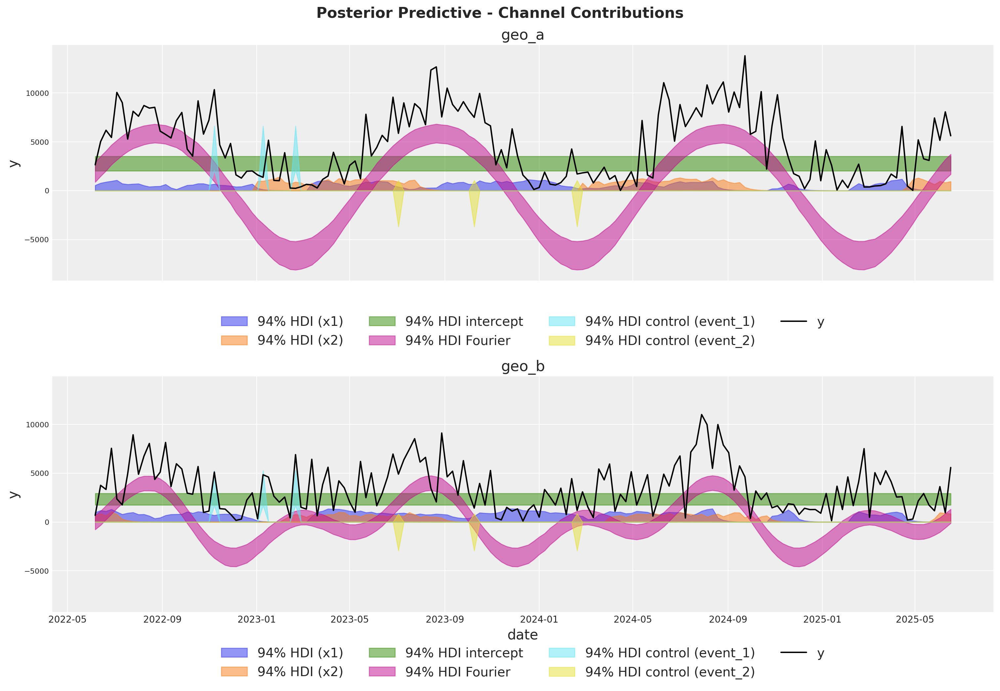

In [23]:
fig, axes = plt.subplots(
    nrows=len(mmm.model.coords["geo"]),
    figsize=(15, 10),
    sharex=True,
    sharey=True,
    layout="constrained",
)

for i, geo in enumerate(mmm.model.coords["geo"]):
    ax = axes[i]

    for j, channel in enumerate(mmm.model.coords["channel"]):
        az.plot_hdi(
            x=mmm.model.coords["date"],
            y=mmm.idata["posterior"]["channel_contribution_original_scale"].sel(
                geo=geo, channel=channel
            ),
            color=f"C{j}",
            smooth=False,
            hdi_prob=0.94,
            fill_kwargs={"alpha": 0.5, "label": f"94% HDI ({channel})"},
            ax=ax,
        )

    az.plot_hdi(
        x=mmm.model.coords["date"],
        y=mmm.idata["posterior"]["intercept_contribution_original_scale"]
        .sel(geo=geo)
        .expand_dims({"date": mmm.model.coords["date"]})
        .transpose(..., "date"),
        color="C2",
        smooth=False,
        hdi_prob=0.94,
        fill_kwargs={"alpha": 0.5, "label": "94% HDI intercept"},
        ax=ax,
    )

    az.plot_hdi(
        x=mmm.model.coords["date"],
        y=mmm.idata["posterior"]["yearly_seasonality_contribution_original_scale"].sel(
            geo=geo,
        ),
        color="C3",
        smooth=False,
        hdi_prob=0.94,
        fill_kwargs={"alpha": 0.5, "label": "94% HDI Fourier"},
        ax=ax,
    )

    for k, control in enumerate(mmm.model.coords["control"]):
        az.plot_hdi(
            x=mmm.model.coords["date"],
            y=mmm.idata["posterior"]["control_contribution_original_scale"].sel(
                geo=geo, control=control
            ),
            color=f"C{5 + k}",
            smooth=False,
            hdi_prob=0.94,
            fill_kwargs={"alpha": 0.5, "label": f"94% HDI control ({control})"},
            ax=ax,
        )

    sns.lineplot(
        data=data_df.query("geo == @geo"),
        x="date",
        y="y",
        color="black",
        label="y",
        ax=ax,
    )
    ax.legend(
        loc="upper center",
        bbox_to_anchor=(0.5, -0.1),
        ncol=4,
    )
    ax.set(title=f"{geo}")

fig.suptitle(
    "Posterior Predictive - Channel Contributions",
    fontsize=16,
    fontweight="bold",
    y=1.03,
);

## Media Deep Dive

Next, we can look into the individual channel contributions across geos. This new class has a new `plot` name space that contains many plotting methods.

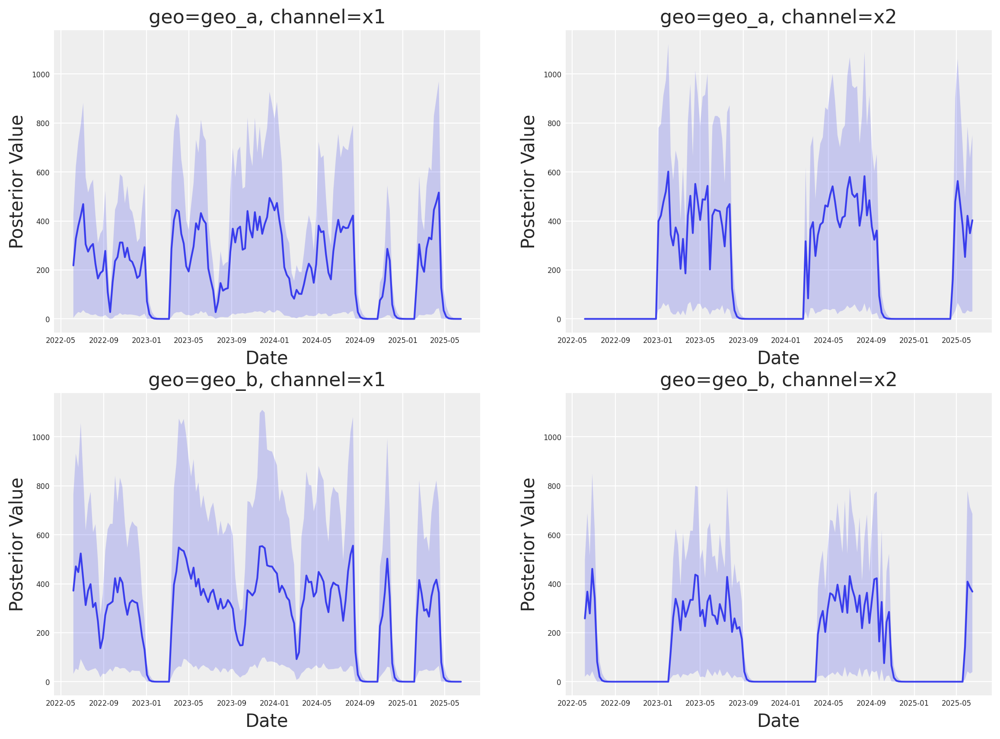

In [24]:
fig, axes = mmm.plot.contributions_over_time(
    var=["channel_contribution_original_scale"],
)

# Adjust figure size and layout to 2x2
fig.set_size_inches(14, 10)
fig.set_constrained_layout(True)

# Reshape axes to 2x2 grid
num_axes = len(axes.flatten())
if num_axes > 0:
    # Create a new 2x2 grid
    gs = fig.add_gridspec(2, 2)

    # Move existing axes to the new grid
    for i, ax in enumerate(axes.flatten()):
        if i < 4:  # Only handle up to 4 axes for 2x2 grid
            ax.set_position(gs[i // 2, i % 2].get_position(fig))

axes = axes.flatten()

# Share x and y axes across all subplots
for ax in axes:
    ax.legend().remove()
    ax.tick_params(axis="both", which="major", labelsize=6)
    ax.tick_params(axis="both", which="minor", labelsize=6)

# Share y axis limits
y_min = min(ax.get_ylim()[0] for ax in axes)
y_max = max(ax.get_ylim()[1] for ax in axes)
for ax in axes:
    ax.set_ylim(y_min, y_max)

# Share x axis limits
x_min = min(ax.get_xlim()[0] for ax in axes)
x_max = max(ax.get_xlim()[1] for ax in axes)
for ax in axes:
    ax.set_xlim(x_min, x_max)

We can plot the saturation curves for each channel and geo, using a few different functions:
1. Using `saturation_scatterplot`, we can get only the scatterplot between investment and estimated returns.
2. Using `saturation_curves`, we can get the posterior of the curves and their posterior fit regarding the given mean contribution.

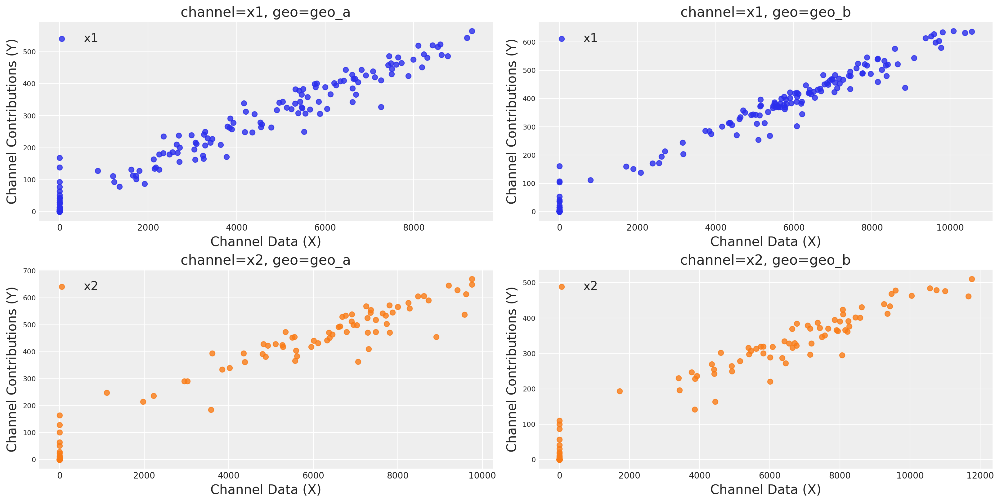

In [25]:
mmm.plot.saturation_scatterplot(width_per_col=8, height_per_row=4, original_scale=True);

Sampling: []


Output()

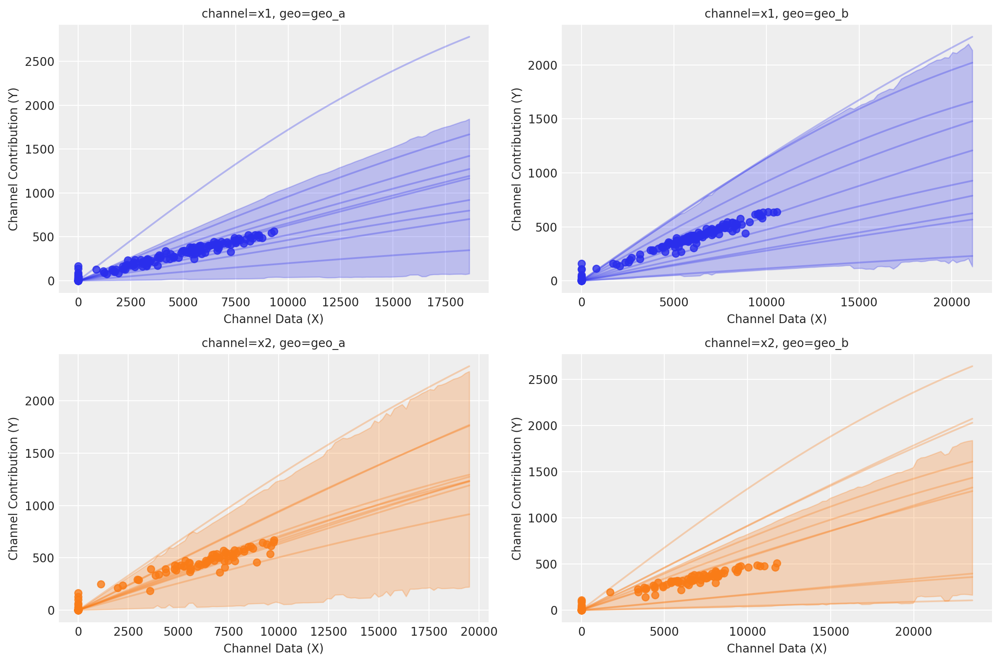

In [26]:
curve = mmm.saturation.sample_curve(mmm.idata.posterior, max_value=2)
fig, axes = mmm.plot.saturation_curves(
    curve,
    original_scale=True,
    n_samples=10,
    hdi_probs=0.85,
    random_seed=rng,
    subplot_kwargs={"figsize": (12, 8), "ncols": 2},
    rc_params={
        "xtick.labelsize": 10,
        "ytick.labelsize": 10,
        "axes.labelsize": 10,
        "axes.titlesize": 10,
    },
)

for ax in axes.ravel():
    ax.title.set_fontsize(10)

if fig._suptitle is not None:
    fig._suptitle.set_fontsize(12)

plt.tight_layout()
plt.show()

## Parameter recovery

One nice sign that the model is working as intend is that it can recover the true parameter values underlying the marketing mechanism. In our case, we know the true parameter values because we simulated the date. Informally, if the bulk of the posterior distribution covers the parameter value, that's a good sign. We do not expect the mean of the posterior to always line up with the true value - for small or noisy data, we should expect the posterior to cover a wide interval regardless of whether we built a good model or not. There are also [formal frameworks](https://arxiv.org/abs/2502.03279) for thinking about parameter recovery in simulations that might be helpful if you need even more rigorous evidence the model is working correctly.

Below we compare the posterior distribution to the true values for the main MMM parameters (`saturation lambda`, `saturation beta` and `adstock alpha`).

In [27]:
# Load the true parameters used to generate the data

data_path = data_dir / "mmm_multidimensional_example_true_parameters.nc"
true_parameters = xr.open_dataset(data_path)

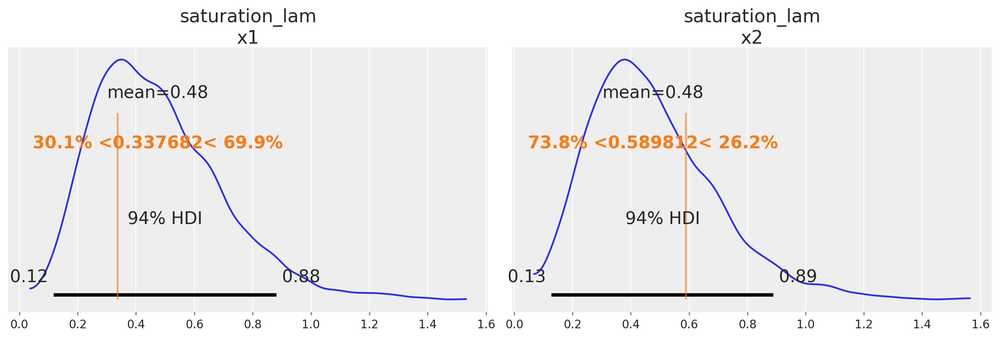

In [28]:
az.plot_posterior(
    mmm.fit_result,
    var_names=[
        "saturation_lam",
    ],
    figsize=(12, 4),
    ref_val={
        "saturation_lam": [
            {
                "channel": "x1",
                "ref_val": true_parameters["saturation_lam"].sel(channel="x1").values,
            },
            {
                "channel": "x2",
                "ref_val": true_parameters["saturation_lam"].sel(channel="x2").values,
            },
        ]
    },
);

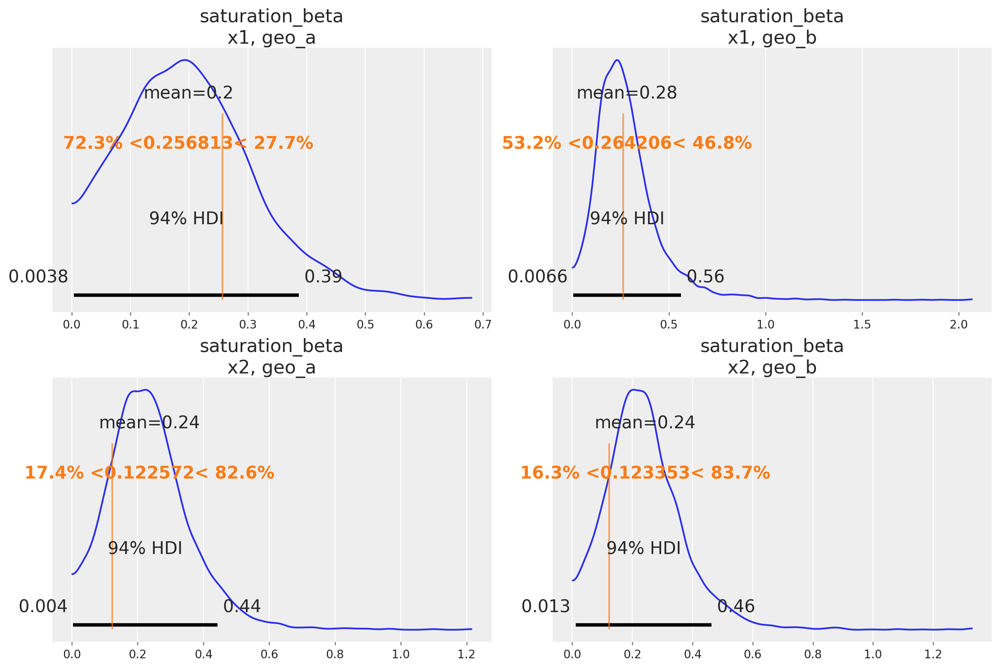

In [29]:
az.plot_posterior(
    mmm.fit_result,
    var_names=[
        "saturation_beta",
    ],
    grid=(2, 2),
    figsize=(12, 8),
    ref_val={
        "saturation_beta": [
            {
                "channel": "x1",
                "geo": "geo_a",
                "ref_val": true_parameters["saturation_beta"]
                .sel(channel="x1", geo="geo_a")
                .values,
            },
            {
                "channel": "x2",
                "geo": "geo_a",
                "ref_val": true_parameters["saturation_beta"]
                .sel(channel="x2", geo="geo_a")
                .values,
            },
            {
                "channel": "x1",
                "geo": "geo_b",
                "ref_val": true_parameters["saturation_beta"]
                .sel(channel="x1", geo="geo_b")
                .values,
            },
            {
                "channel": "x2",
                "geo": "geo_b",
                "ref_val": true_parameters["saturation_beta"]
                .sel(channel="x2", geo="geo_b")
                .values,
            },
        ]
    },
);

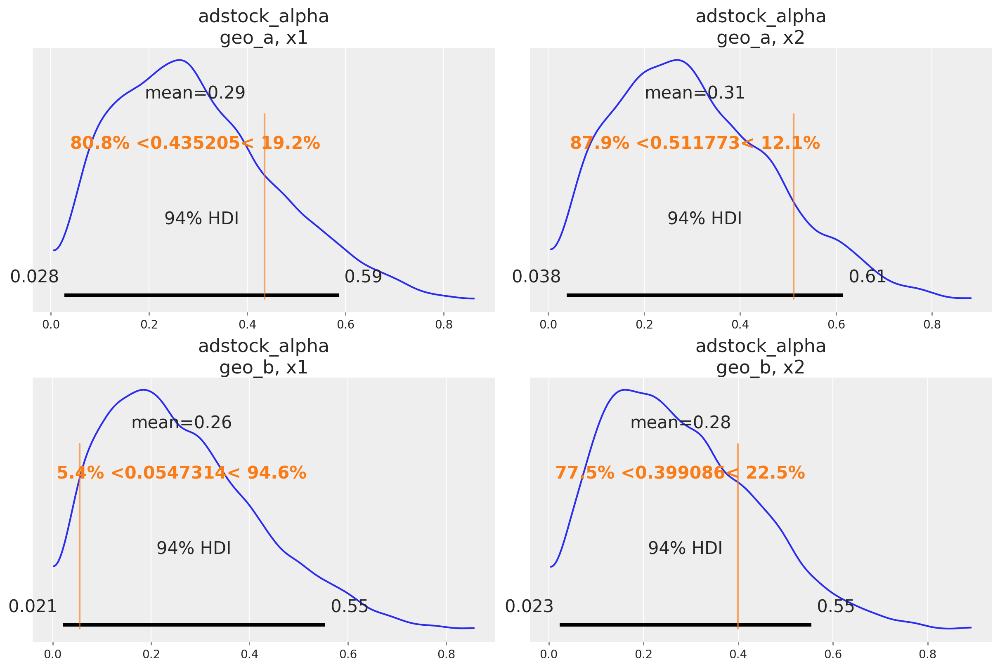

In [30]:
az.plot_posterior(
    mmm.fit_result,
    var_names=[
        "adstock_alpha",
    ],
    grid=(2, 2),
    figsize=(12, 8),
    ref_val={
        "adstock_alpha": [
            {
                "channel": "x1",
                "geo": "geo_a",
                "ref_val": true_parameters["adstock_alpha"]
                .sel(channel="x1", geo="geo_a")
                .values,
            },
            {
                "channel": "x2",
                "geo": "geo_a",
                "ref_val": true_parameters["adstock_alpha"]
                .sel(channel="x2", geo="geo_a")
                .values,
            },
            {
                "channel": "x1",
                "geo": "geo_b",
                "ref_val": true_parameters["adstock_alpha"]
                .sel(channel="x1", geo="geo_b")
                .values,
            },
            {
                "channel": "x2",
                "geo": "geo_b",
                "ref_val": true_parameters["adstock_alpha"]
                .sel(channel="x2", geo="geo_b")
                .values,
            },
        ]
    },
);

## Out of Sample Predictions

It is very important to be able to make predictions out of the sample. This is key for model validation, forward looking scenario planning and business decision making. Similarly as in the {ref}`mmm_example`, we assume the future spends are the same as the last day in the training sample. This way we can create a new dataset with the future dates and channel spends and use the model to make predictions.

In [31]:
last_date = x_train["date"].max()

# New dates starting from last in dataset
n_new = 7
new_dates = pd.date_range(start=last_date, periods=1 + n_new, freq="W-MON")[1:]

x_out_of_sample_geo_a = pd.DataFrame({"date": new_dates, "geo": "geo_a"})
x_out_of_sample_geo_b = pd.DataFrame({"date": new_dates, "geo": "geo_b"})

# Same channel spends as last day
x_out_of_sample_geo_a["x1"] = x_train.query("geo == 'geo_a'")["x1"].iloc[-1]
x_out_of_sample_geo_a["x2"] = x_train.query("geo == 'geo_a'")["x2"].iloc[-1]

x_out_of_sample_geo_b["x1"] = x_train.query("geo == 'geo_b'")["x1"].iloc[-1]
x_out_of_sample_geo_b["x2"] = x_train.query("geo == 'geo_b'")["x2"].iloc[-1]

# Other features
## Event 1
x_out_of_sample_geo_a["event_1"] = 0.0
x_out_of_sample_geo_a["event_2"] = 0.0
## Event 2
x_out_of_sample_geo_b["event_1"] = 0.0
x_out_of_sample_geo_b["event_2"] = 0.0

x_out_of_sample = pd.concat([x_out_of_sample_geo_a, x_out_of_sample_geo_b])

# Final dataset to generate out of sample predictions.
x_out_of_sample

,date,geo,x1,x2,event_1,event_2
0,2025-06-23,geo_a,0.0,6384.065021,0.0,0.0
1,2025-06-30,geo_a,0.0,6384.065021,0.0,0.0
2,2025-07-07,geo_a,0.0,6384.065021,0.0,0.0
3,2025-07-14,geo_a,0.0,6384.065021,0.0,0.0
4,2025-07-21,geo_a,0.0,6384.065021,0.0,0.0
5,2025-07-28,geo_a,0.0,6384.065021,0.0,0.0
6,2025-08-04,geo_a,0.0,6384.065021,0.0,0.0
0,2025-06-23,geo_b,0.0,8090.900533,0.0,0.0
1,2025-06-30,geo_b,0.0,8090.900533,0.0,0.0
2,2025-07-07,geo_b,0.0,8090.900533,0.0,0.0


Using the same `sample_posterior_predictive` method, we can now generate the forecast.

In [ ]:
y_out_of_sample = mmm.sample_posterior_predictive(
    x_out_of_sample,
    extend_idata=False,
    include_last_observations=True,
    random_seed=rng,
    var_names=["y_original_scale"],
)

y_out_of_sample

Sampling: [y]


Output()

<xarray.Dataset> Size: 544kB
Dimensions:           (date: 7, geo: 2, sample: 4000)
Coordinates:
  * date              (date) datetime64[ns] 56B 2025-06-23 ... 2025-08-04
  * geo               (geo) <U5 40B 'geo_a' 'geo_b'
  * sample            (sample) object 32kB MultiIndex
  * chain             (sample) int64 32kB 0 0 0 0 0 0 0 0 0 ... 3 3 3 3 3 3 3 3
  * draw              (sample) int64 32kB 0 1 2 3 4 5 ... 995 996 997 998 999
Data variables:
    y_original_scale  (date, geo, sample) float64 448kB 7.215e+03 ... 6.687e+03
Attributes:
    created_at:                 2026-01-26T15:51:31.302277+00:00
    arviz_version:              0.23.0
    inference_library:          pymc
    inference_library_version:  5.27.0

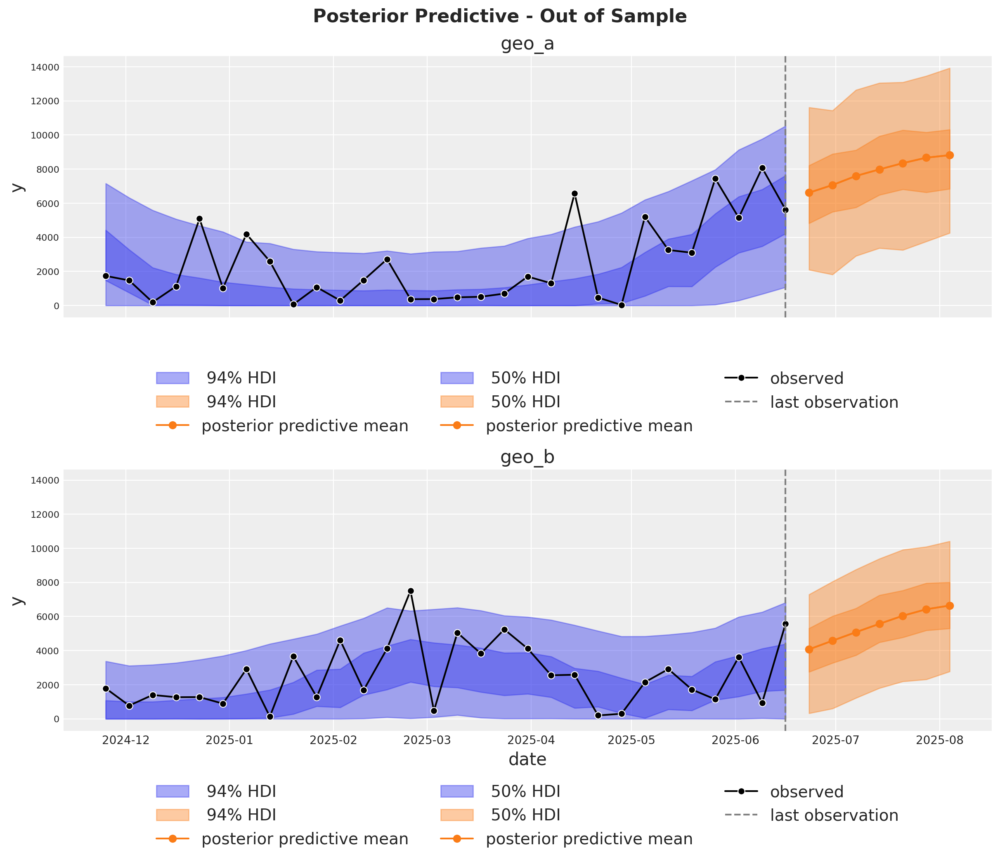

In [33]:
fig, axes = plt.subplots(
    nrows=2,
    ncols=1,
    figsize=(12, 10),
    sharex=True,
    sharey=True,
    layout="constrained",
)

n_train_to_plot = 30

for ax, geo in zip(axes, mmm.model.coords["geo"], strict=True):
    for hdi_prob in [0.94, 0.5]:
        az.plot_hdi(
            x=mmm.model.coords["date"][-n_train_to_plot:],
            y=(
                mmm.idata["posterior_predictive"].y_original_scale.sel(geo=geo)[
                    :, :, -n_train_to_plot:
                ]
            ),
            color="C0",
            smooth=False,
            hdi_prob=hdi_prob,
            fill_kwargs={"alpha": 0.4, "label": f"{hdi_prob: 0.0%} HDI"},
            ax=ax,
        )

        az.plot_hdi(
            x_out_of_sample.query("geo == @geo")["date"],
            (
                y_out_of_sample["y_original_scale"]
                .sel(geo=geo)
                .unstack()
                .transpose(..., "date")
            ),
            color="C1",
            smooth=False,
            hdi_prob=hdi_prob,
            fill_kwargs={"alpha": 0.4, "label": f"{hdi_prob: 0.0%} HDI"},
            ax=ax,
        )

        ax.plot(
            x_out_of_sample.query("geo == @geo")["date"],
            y_out_of_sample["y_original_scale"].sel(geo=geo).mean(dim="sample"),
            marker="o",
            color="C1",
            label="posterior predictive mean",
        )

    sns.lineplot(
        data=data_df.query("(geo == @geo)").tail(n_train_to_plot),
        x="date",
        y="y",
        marker="o",
        color="black",
        label="observed",
        ax=ax,
    )

    ax.axvline(x=last_date, color="gray", linestyle="--", label="last observation")
    ax.legend(
        loc="upper center",
        bbox_to_anchor=(0.5, -0.15),
        ncol=3,
    )
    ax.set(title=f"{geo}")

fig.suptitle(
    "Posterior Predictive - Out of Sample", fontsize=16, fontweight="bold", y=1.03
);

## Optimization

If you want to run optimizations, then you need to use the `MultiDimensionalBudgetOptimizerWrapper`.

In [34]:
optimizable_model = MultiDimensionalBudgetOptimizerWrapper(
    model=mmm, start_date="2021-10-01", end_date="2021-12-31"
)

allocation_xarray, scipy_opt_result = optimizable_model.optimize_budget(
    budget=100_000,
)

sample_allocation = optimizable_model.sample_response_distribution(
    allocation_strategy=allocation_xarray,
)

Sampling: [y]


This object is an xarray dataset with the allocation and posterior predictive responses!

In [35]:
sample_allocation

<xarray.Dataset> Size: 4MB
Dimensions:                                  (date: 21, geo: 2, channel: 2,
                                              sample: 4000)
Coordinates:
  * date                                     (date) datetime64[ns] 168B 2021-...
  * geo                                      (geo) <U5 40B 'geo_a' 'geo_b'
  * channel                                  (channel) <U2 16B 'x1' 'x2'
  * sample                                   (sample) object 32kB MultiIndex
  * chain                                    (sample) int64 32kB 0 0 0 ... 3 3 3
  * draw                                     (sample) int64 32kB 0 1 ... 998 999
Data variables:
    channel_contribution                     (date, geo, channel, sample) float64 3MB ...
    total_media_contribution_original_scale  (sample) float64 32kB 6.329e+04 ...
    y                                        (date, geo, sample) float64 1MB ...
    allocation                               (geo, channel) float64 32B 2.414...
    x1                                       (date, geo) float64 336B 2.415e+...
    x2                                       (date, geo) float64 336B 3.05e+0...
Attributes:
    created_at:                 2026-01-26T15:51:35.610974+00:00
    arviz_version:              0.23.0
    inference_library:          pymc
    inference_library_version:  5.27.0

Once you get the allocation, you can plot a the results 🚀

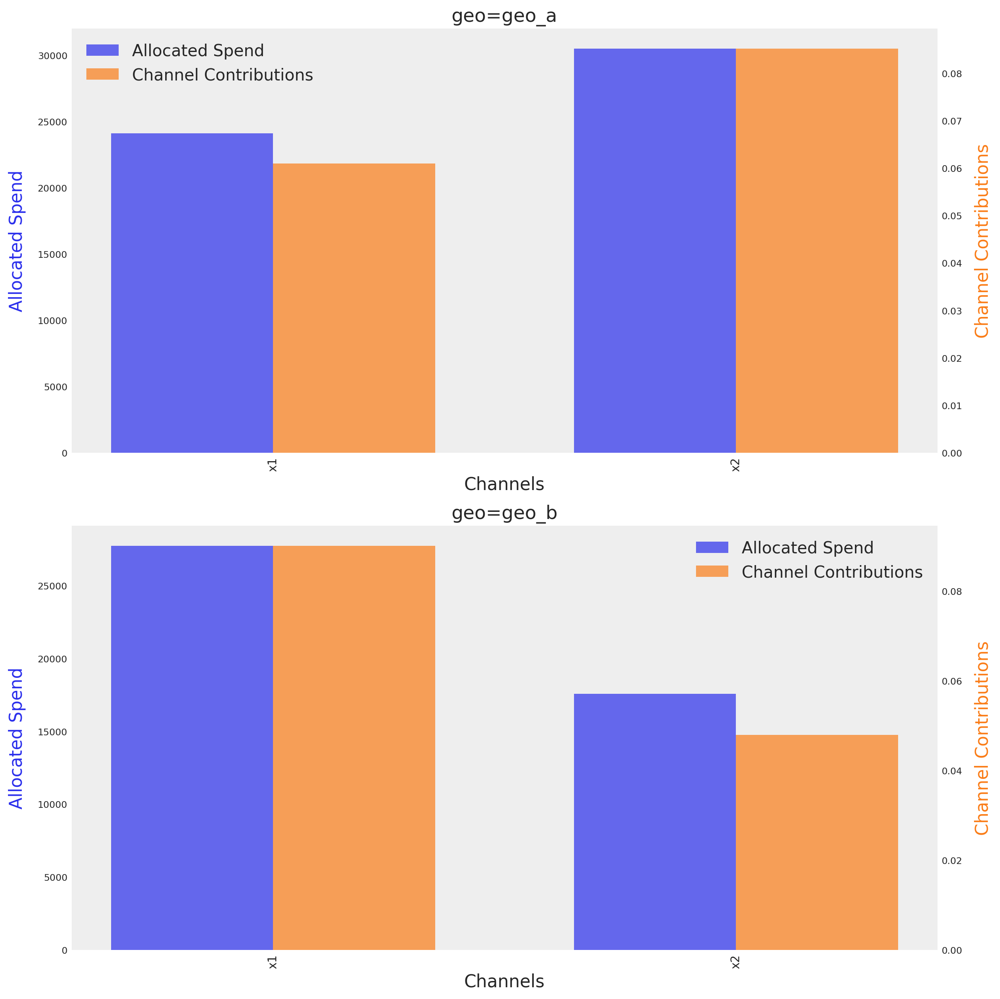

In [36]:
optimizable_model.plot.budget_allocation(
    samples=sample_allocation,
);

The graph shows the optimal budget for each channel on each geo, next to their respective mean contribution given the optimal budget. The method identify automatically the number of dimensions and tries to create a plot based on them.

If you want to see the full uncertainty over time, you can use the plot suite and the method `allocated_contribution_by_channel_over_time`.

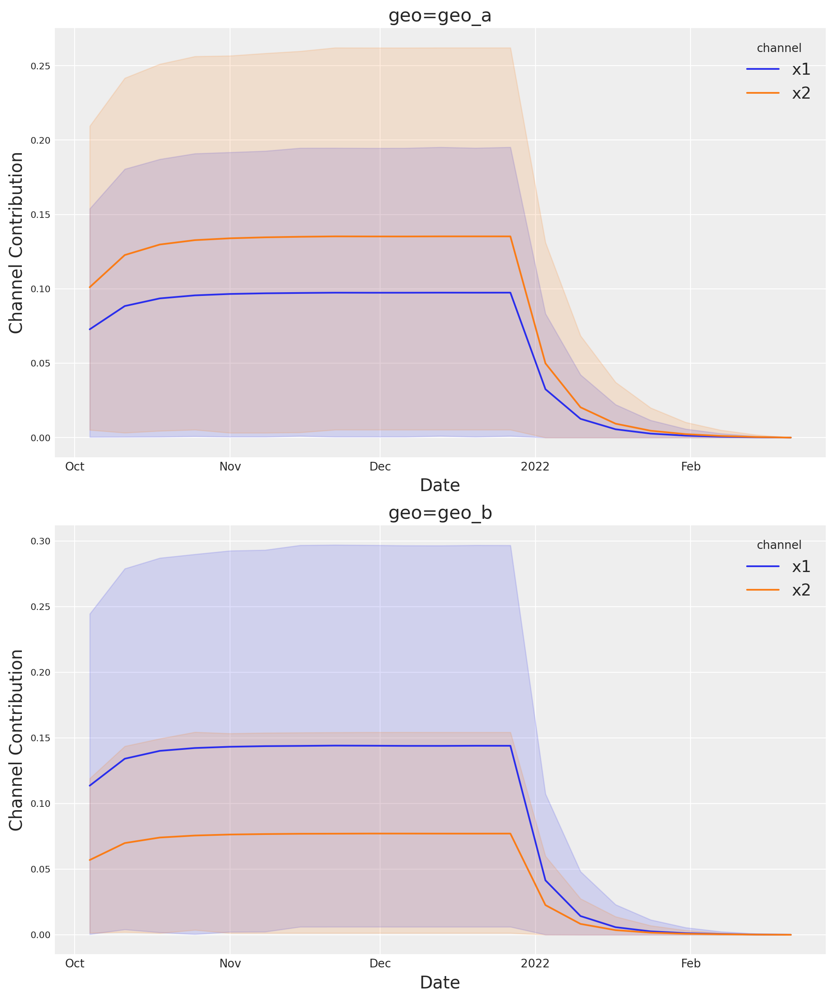

In [37]:
optimizable_model.plot.allocated_contribution_by_channel_over_time(
    samples=sample_allocation,
);

If you have a custom model, you can wrapped it into the model protocol, and use the optimizer after. If your model handle scales internally, you don't need to modify anything. Otherwise, for the plots, you may want to use `scale_factor=N`. E.g:

```python
optimizable_model.plot.budget_allocation(
    samples=sample_allocation,
    scale_factor=120
);
```

## Save Model

You can optionally save the result of your hard work. The model result objects (idata) can get very large once we start working in multiple dimensions. So it can sometimes be helpful to compress the idata before saving. Below are a couple of tricks.

In [38]:
# Reduce your posterior (optional)
# clone_idata = mmm.idata.copy()
# clone_idata.posterior = clone_idata.posterior.astype(np.float32)
# clone_idata.posterior = clone_idata.posterior.sel(draw=slice(None, None, 10))

# clone_idata.to_netcdf("multidimensional_model_compressed.nc", groups=["posterior", "fit_data"], engine="h5netcdf")

```{note}
We are very excited about this new feature and the possibilities it opens up. We are looking forward to hearing your feedback!
```

In [39]:
%load_ext watermark
%watermark -n -u -v -iv -w -p pymc_marketing,pytensor,nutpie

Last updated: Mon, 26 Jan 2026

Python implementation: CPython
Python version       : 3.13.11
IPython version      : 9.9.0

pymc_marketing: 0.17.1
pytensor      : 2.36.3
nutpie        : 0.16.4

arviz         : 0.23.0
matplotlib    : 3.10.8
numpy         : 2.3.5
pandas        : 2.3.3
pymc          : 5.27.0
pymc_extras   : 0.7.0
pymc_marketing: 0.17.1
seaborn       : 0.13.2
xarray        : 2025.12.0

Watermark: 2.6.0

